In [17]:
#export
import librosa
import numpy as np

from operator import itemgetter
from itertools import groupby

import os.path

import IPython.display as ipd

import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

In [21]:
audio_name = "test"
audio_path = audio_name + ".wav"
if os.path.isfile(audio_path):
    y , sample_rate = librosa.load(audio_path,sr=None)
    ipd.Audio(y,rate=sample_rate)
else:
    print(audio_path + " not found!")
    


test2.wav not found!


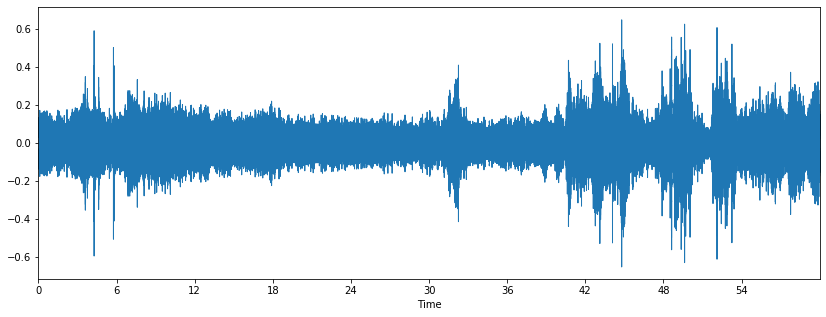

In [3]:
#display waveform
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sample_rate)

Filtering within bands

In [4]:
n_fft = 1024
hop_length = int(float(n_fft)/4)

S_full, phase = librosa.magphase(librosa.stft(y,n_fft=n_fft))

# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.
S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sample_rate)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)
                                       
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

#margin_i = 2
margin_v = 10
power = 2

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full

foreground_isolation_audio = librosa.istft(S_foreground)
ipd.Audio(foreground_isolation_audio,rate=sample_rate)

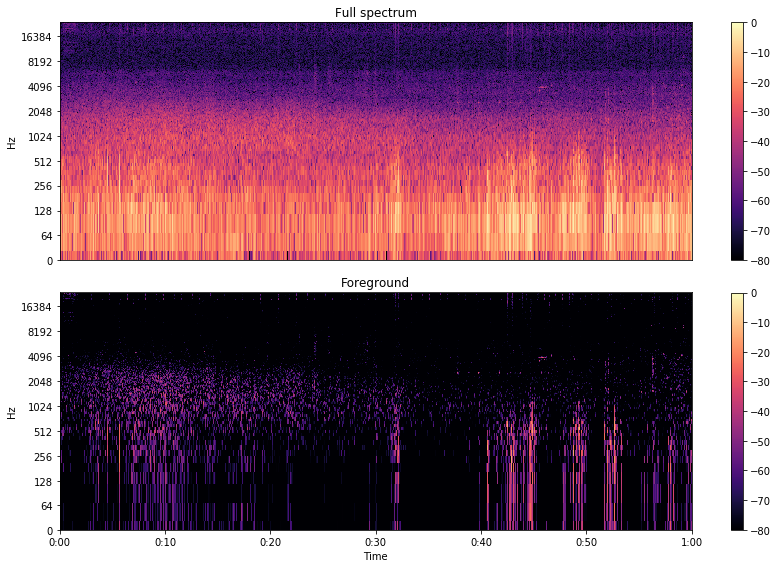

In [5]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sample_rate,hop_length=hop_length)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sample_rate,hop_length=hop_length)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [6]:
def keep_local(data,freq_indexes,beep_duration= 3,beep_period = 188, beep_period_variance=3):
    sample_length = data.shape[1]
    for row_ind in range(data[freq_indexes,:].shape[0]):
        non_zero_row = np.nonzero(data[freq_indexes[row_ind],:])[0]
        new_row = np.zeros(sample_length)
        if non_zero_row.size > 0:
            valid_pos = []

            for k,g in groupby(enumerate(non_zero_row),lambda x:x[0]-x[1]):
                group = (map(itemgetter(1),g))
                group = list(map(int,group))
                if len(group) >= beep_duration:
                    valid_pos.append((group[0],group[-1]))
            
            new_valid = np.array([])
            
            #dependent on a beat, needs beep either before or after
            if len(valid_pos) > 1:
                prev_mean = 0
                for ele_ind in range(0,len(valid_pos)-1,1):
                    curr_mean = int((valid_pos[ele_ind][0] + valid_pos[ele_ind][1])/2)
                    future_mean = int((valid_pos[ele_ind+1][0] + valid_pos[ele_ind+1][1])/2)
                    diff_1 = curr_mean-prev_mean
                    diff_2 = future_mean-curr_mean
                    prev_mean = curr_mean
                    if((beep_period-beep_period_variance < diff_1 < beep_period+beep_period_variance) 
                       or (beep_period-beep_period_variance < diff_2 < beep_period+beep_period_variance)):
                        new_valid = np.hstack((new_valid,np.arange(valid_pos[ele_ind][0],valid_pos[ele_ind][1])))

            new_valid = np.unique(new_valid).astype(int)
            
            if len(new_valid) > 1:
                new_row[new_valid] = data[freq_indexes[row_ind],new_valid]

        data[freq_indexes[row_ind],:] = new_row
        
        
    return data
        

In [7]:
#constants
n_fft = 1024
hop_length = int(float(n_fft)/4)

#in seconds
beep_duration_time = 0.02666666666666667

beep_period_time = 1.0133333333333334
beep_period_time_variance = 0.02666666666666667

harmonic_freq_ranges = [[-1,-1],
                        [2500,2800]]

#Convert seconds to matrix frames
beep_duration_frames = librosa.time_to_frames(beep_duration_time,sr=sample_rate,hop_length=hop_length)
beep_period_frames = librosa.time_to_frames(beep_period_time,sr=sample_rate, hop_length=hop_length)-2
beep_period_frames_variance = librosa.time_to_frames(beep_period_time_variance,sr=sample_rate, hop_length=hop_length)-2

#Begin isolation
STFT_results = np.abs(librosa.stft(foreground_isolation_audio,n_fft=n_fft))

#Calculates frequency bins
fft_freqs = librosa.fft_frequencies(sr=sample_rate, n_fft=n_fft)

#Collect STFT index of focus frequency ranges
freq_indexes = np.array([])
for harmonic in harmonic_freq_ranges:
    current_indexes = np.nonzero((fft_freqs>=harmonic[0]) & (fft_freqs<=harmonic[1]))[0]
    freq_indexes = np.append(freq_indexes,current_indexes)

freq_indexes = freq_indexes.astype(int)   

#frequency of actual bins in ranges
real_freqs = fft_freqs[freq_indexes]

#Sets all components not in crosswalk band frequency to zero
bandlimited_STFT_results = np.zeros(STFT_results.shape)
bandlimited_STFT_results[freq_indexes,:] = STFT_results[freq_indexes,:]


threshold = 0.01
bandlimited_STFT_results[bandlimited_STFT_results < threshold] = 0
local_STFT_results = keep_local(bandlimited_STFT_results,freq_indexes=freq_indexes,beep_duration=beep_duration_frames,beep_period=beep_period_frames,beep_period_variance=beep_period_frames_variance)


filtered_isolation_audio = librosa.istft(local_STFT_results)
ipd.Audio(filtered_isolation_audio,rate=sample_rate)

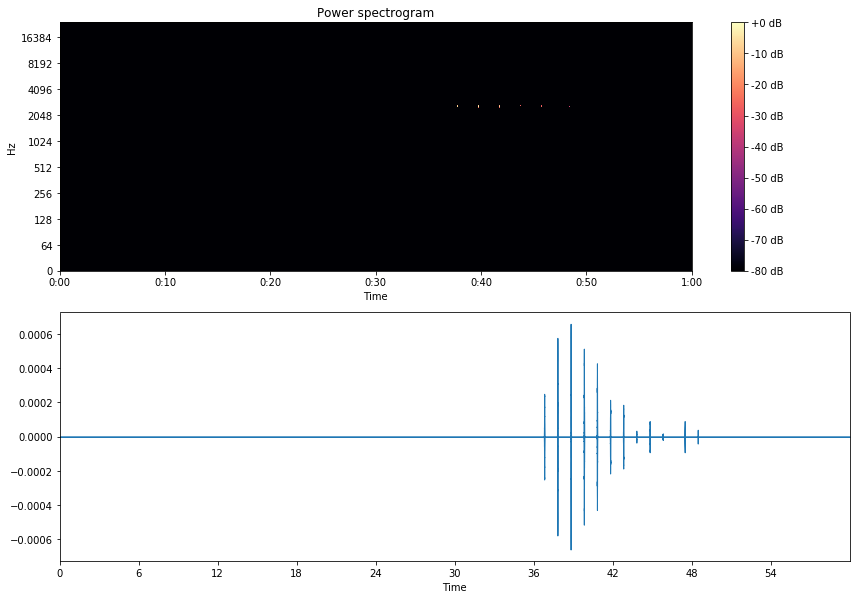

In [8]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(local_STFT_results,ref=np.max),y_axis='log', x_axis='time'
                         ,sr=sample_rate,hop_length=hop_length)
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

plt.subplot(2, 1, 2)
librosa.display.waveplot(filtered_isolation_audio, sr=sample_rate)
plt.show()

In [9]:
#beep detection
onset_frames = librosa.onset.onset_detect(y=filtered_isolation_audio, sr=sample_rate)
times = librosa.frames_to_time(onset_frames, sr=sample_rate)
print(times)

[36.78933333 37.78133333 38.784      39.78666667 40.78933333 41.792
 42.79466667 43.79733333 44.8        45.792      47.44533333 48.45866667]


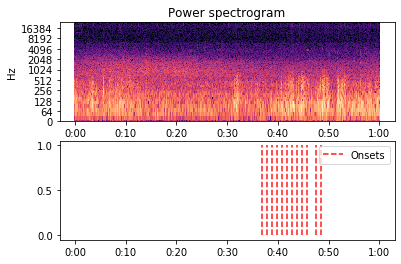

In [10]:
D = np.abs(librosa.stft(y))
plt.figure()
ax1 = plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         x_axis='time', y_axis='log',sr=sample_rate)
plt.title('Power spectrogram')
plt.subplot(2, 1, 2, sharex=ax1)
plt.vlines(times, 0, 1, color='r', alpha=0.9,
           linestyle='--', label='Onsets')
plt.axis('tight')
plt.legend(frameon=True, framealpha=0.75)
plt.show()

In [15]:
if len(times) > 0:
    access_type = ""
    text_file_path = audio_name + ".txt"
    #TODO consider text writing methods
    if os.path.isfile(text_file_path):
        access_type = "a"
        print("File exists, will append")
    else:
        access_type = "w"
        print("File does not exist, will write")
     
    output_text_file = open(text_file_path, access_type)
    for time_element in times:
        start_time = int(time_element*1000)
        end_time = int(start_time + beep_duration_time*1000)
        output_text_file.write(str(start_time) + " " + str(end_time) + " " + "crosswalk\n")

    output_text_file.close()
else:
    print("No cross-walk audio found in " + audio_path+ ".wav")


    


File exists, will append
